# Diffusion with Adsorption in Polymers
Edited by: Sam Zhang, szhang32@nd.edu

## References

* Paul, D. R. (1969). Effect of immobilizing adsorption on the diffusion time lag. Journal of Polymer Science Part A‐2: Polymer Physics, 7(10), 1811-1818. [[pdf](https://onlinelibrary.wiley.com/doi/pdf/10.1002/pol.1969.160071015?)]

* Vieth, W. R., & Sladek, K. J. (1965). A model for diffusion in a glassy polymer. Journal of Colloid Science, 20(9), 1014-1033. [[doi](https://doi.org/10.1016/0095-8522(65)90071-1)]

## Model

Here we consider the diffusion of a small molecule into an immobile substrate with adsorption. Following the cited references:

$$
\begin{align*}
\frac{\partial (c + c_a)}{\partial t} & = D \frac{\partial^2 c}{\partial x^2} \\
\end{align*}
$$

Langmuir isotherm:

$$
\begin{align*}
c_a & = \frac{q K c}{1 + K c}
\end{align*}
$$

After application of the chain rule:

$$
\begin{align*}
\left[1 + \frac{q K}{(1 + K c)^2}\right]\frac{\partial c}{\partial t} & = D \frac{\partial^2 c}{\partial x^2} \\
\end{align*}
$$

Initial conditions for $c(t, x)$:

$$
\begin{align*}
c(0, x) & = 0 & 0 < x \leq L \\
\end{align*}
$$

Boundary conditions for $c(t, x)$:

$$
\begin{align*}
c(t, 0) & = C_0 & t \geq 0 \\
c_x(t, L) & = 0 & t \geq 0 \\
\end{align*}
$$

**Exercise 1**: Verify the use of the chain rule. Generalize to an arbitrary isotherm $c = f(c_a)$.

**Exercise 2**: Compare the dimensional and dimensionless implementations by finding values for dimensionless value of $\alpha$ and surface concentration that reproduce the simulation results observed in dimensional model.

**Exercise 3**: Implement a Pyomo model as a DAE without using the chain rule.

**Exercise 4**: Replace the finite difference transformation on $x$ with collocation. What (if any) practical advantages are associated with collocation?

**Exercise 5**: Revise the problem and model with a linear isotherm $c_a = K c$, and use the solution concentration $C_s$ to scale $c(t, x)$. How many independent physical parameters exist for this problem? Find the analytical solution, and compare to a numerical solution found using Pyomo.DAE.

**Exercise 6**: Revise the dimensionless model for the Langmuir isotherm to use the solution concentraion $C_s$ to scale $c(x, t)$. How do the models compare? How many independent parameters exist for this problem? What physical or chemical interpretations can you assign to the dimensionless parameters appearing in the models?

**Exercise 7**: The Langmuir isotherm is an equilibrium relationship between absorption and desorption processes. The Langmuir isotherm assumes these processes are much faster than diffusion. Formulate the model for the case where absorption and desorption kinetics are on a time scale similar to the diffusion process.

## Installations and Imports

In [2]:
import matplotlib.pyplot as plt
import numpy as np

import os
import sys
import shutil
import subprocess

if "google.colab" in sys.modules:
    !wget "https://raw.githubusercontent.com/IDAES/idaes-pse/main/scripts/colab_helper.py"
    import colab_helper
    colab_helper.install_idaes()
    colab_helper.install_ipopt()

import pyomo.environ as pyo

--2023-11-03 20:03:06--  https://raw.githubusercontent.com/IDAES/idaes-pse/main/scripts/colab_helper.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5459 (5.3K) [text/plain]
Saving to: ‘colab_helper.py’

colab_helper.py     100%[===================>]   5.33K  --.-KB/s    in 0s      

2023-11-03 20:03:06 (54.2 MB/s) - ‘colab_helper.py’ saved [5459/5459]

Installing idaes via pip...
idaes was successfully installed
idaes, version 2.2.0


Running idaes get-extensions to install Ipopt, k_aug, and more...
Checking solver versions:
Ipopt 3.13.2 (x86_64-pc-linux-gnu), ASL(20190605)



[K_AUG] 0.1.0, Part of the IDAES PSE framework
Please visit https://idaes.org/ (x86_64-pc-linux-gnu), ASL(20190605)



Couenne 0.5.8 -- an Open-Source solver for Mixed Integer Nonl

## Pyomo model

In [6]:
import pyomo.environ as pyo
import pyomo.dae as dae

# parameters
tf = 80
D = 2.68
L = 1.0
KL = 20000.0
Cs = 0.0025  #adsorption saturation constant
qm = 1.0

m = pyo.ConcreteModel()

m.t = dae.ContinuousSet(bounds=(0, tf))
m.x = dae.ContinuousSet(bounds=(0, L))

m.c = pyo.Var(m.t, m.x)
m.dcdt = dae.DerivativeVar(m.c, wrt=m.t)
m.dcdx = dae.DerivativeVar(m.c, wrt=m.x)
m.d2cdx2 = dae.DerivativeVar(m.c, wrt=(m.x, m.x))

@m.Constraint(m.t, m.x)
def pde(m, t, x):
    return m.dcdt[t, x] * (1 + qm*KL/(1 + KL*m.c[t, x])** 2) == D * m.d2cdx2[t, x]

@m.Constraint(m.t)
def bc1(m, t):
    return m.c[t, 0] == Cs

@m.Constraint(m.t)
def bc2(m, t):
    return m.dcdx[t, L] == 0

@m.Constraint(m.x)
def ic(m, x):
    if x == 0:
        return pyo.Constraint.Skip
    return m.c[0, x] == 0.0

# transform and solve
pyo.TransformationFactory('dae.finite_difference').apply_to(m, wrt=m.x, nfe=40)
pyo.TransformationFactory('dae.finite_difference').apply_to(m, wrt=m.t, nfe=40)
pyo.SolverFactory('ipopt').solve(m).write()

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 6682
  Number of variables: 6683
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Message: Ipopt 3.13.2\x3a Optimal Solution Found
  Termination condition: optimal
  Id: 0
  Error rc: 0
  Time: 8.455214738845825
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


## Visualization

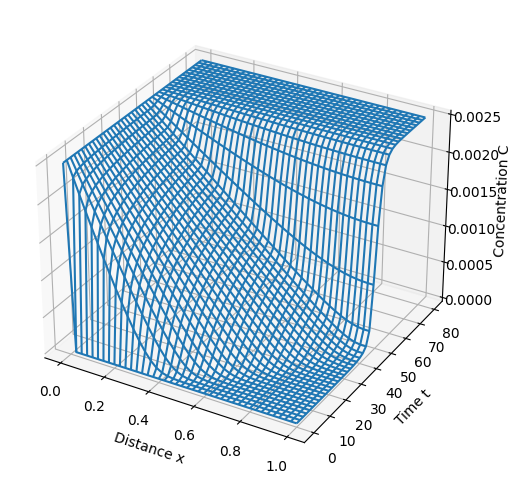

In [4]:
def model_plot(m):
    t = sorted(m.t)
    x = sorted(m.x)

    xgrid = np.zeros((len(t), len(x)))
    tgrid = np.zeros((len(t), len(x)))
    cgrid = np.zeros((len(t), len(x)))

    for i in range(0, len(t)):
        for j in range(0, len(x)):
            xgrid[i,j] = x[j]
            tgrid[i,j] = t[i]
            cgrid[i,j] = m.c[t[i], x[j]].value

    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    ax.set_xlabel('Distance x')
    ax.set_ylabel('Time t')
    ax.set_zlabel('Concentration C')
    p = ax.plot_wireframe(xgrid, tgrid, cgrid)

# visualization
model_plot(m)

## Dimensional analysis

$$
\begin{align*}
x & = L x' \\
c & = C c' \\
t & = T t' \\
\end{align*}
$$

$$
\begin{align*}
\left[1 + \frac{q K}{(1 + K C c')^2}\right]\frac{\partial c'}{\partial t'} & = \frac{TD}{L^2} \frac{\partial^2 c'}{\partial x'^2} \\
\end{align*}
$$

Assuming $L$ is determined by the experimental apparatus, choose

$$
\begin{align*}
T & = \frac{L^2}{D} \\
C & = \frac{1}{K} \\
\end{align*}
$$

which results in a one parameter model

$$
\begin{align*}
\left[1 + \frac{\alpha}{(1 + c')^2}\right]\frac{\partial c'}{\partial t'} & =  \frac{\partial^2 c'}{\partial x'^2} \\
\end{align*}
$$

where $\alpha = q K$ represents a dimensionless capacity of the substrate to absorb the diffusing molecule.

## Dimensionless Pyomo model

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 20501
  Number of variables: 20503
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Message: Ipopt 3.13.2\x3a Optimal Solution Found
  Termination condition: optimal
  Id: 0
  Error rc: 0
  Time: 5.7977986335754395
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


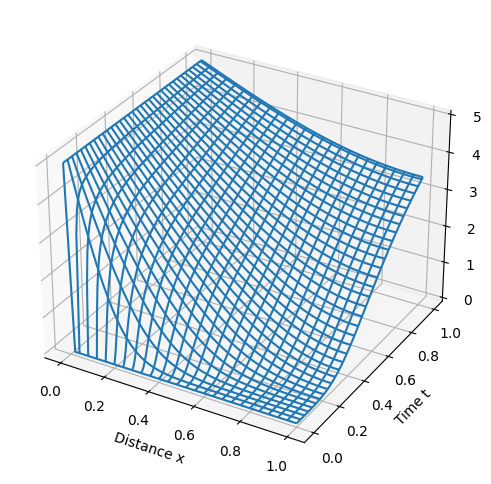

In [5]:
import pyomo.environ as pyo
import pyomo.dae as dae

# parameters
tf = 1.00
Cs = 5.0
alpha = 5.0

m = pyo.ConcreteModel()

m.t = dae.ContinuousSet(bounds=(0, tf))
m.x = dae.ContinuousSet(bounds=(0, 1))

m.c = pyo.Var(m.t, m.x)
m.s = pyo.Var(m.t, m.x)

m.dcdt = dae.DerivativeVar(m.c, wrt=m.t)
m.dcdx = dae.DerivativeVar(m.c, wrt=m.x)
m.d2cdx2 = dae.DerivativeVar(m.c, wrt=(m.x, m.x))

@m.Constraint(m.t, m.x)
def pde(m, t, x):
    return m.dcdt[t, x] * (1 + alpha/(1 + m.c[t, x])** 2) == m.d2cdx2[t, x]

@m.Constraint(m.t)
def bc1(m, t):
    return m.c[t, 0] == Cs

@m.Constraint(m.t)
def bc2(m, t):
    return m.dcdx[t, 1] == 0

@m.Constraint(m.x)
def ic(m, x):
    if (x == 0) or (x == 1):
        return pyo.Constraint.Skip
    return m.c[0, x] == 0.0

# transform and solve
pyo.TransformationFactory('dae.finite_difference').apply_to(m, wrt=m.x, nfe=50)
pyo.TransformationFactory('dae.finite_difference').apply_to(m, wrt=m.t, nfe=100)
pyo.SolverFactory('ipopt').solve(m).write()

model_plot(m)

# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Message: Ipopt 3.13.2\x3a Optimal Solution Found
  Termination condition: optimal
  Id: 0
  Error rc: 0
  Time: 0.43919897079467773
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
# 

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.39440178871154785
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- numbe

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 16.14832067489624
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number 

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 10.666142225265503
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 2.015949249267578
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number 

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 41.64202308654785
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number 

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 15.858944177627563
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: maxIterations
  - message from solver: Ipopt 3.13.2\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 60.75563907623291
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number o

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
<ipython-input-4-8009979d17ee>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,6))


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.7868640422821045
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: maxIterations
  - message from solver: Ipopt 3.13.2\x3a Maximum Number of Iterations Exceeded.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Maximum Number of Iterations Exceeded.
  Termination condition: maxIterations
  Id: 400
  Error rc: 0
  Time: 55.93274188041687
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number o

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 2.497342824935913
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number 

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 10.780985832214355
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 2.3621697425842285
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 12.361754894256592
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.6423830986022949
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 2.7694129943847656
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 18.647305965423584
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 2.078540086746216
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number 

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 2.4416770935058594
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.35810208320617676
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- numbe

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 3.2675955295562744
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.5089483261108398
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 0.6078903675079346
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

  - termination condition: infeasible
  - message from solver: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Lower bound: -inf
  Upper bound: inf
  Number of objectives: 1
  Number of constraints: 1742
  Number of variables: 1743
  Sense: unknown
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: warning
  Message: Ipopt 3.13.2\x3a Converged to a locally infeasible point. Problem may be infeasible.
  Termination condition: infeasible
  Id: 200
  Error rc: 0
  Time: 13.576289653778076
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

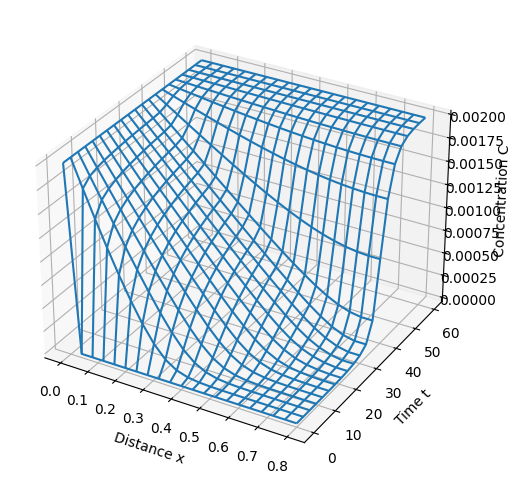

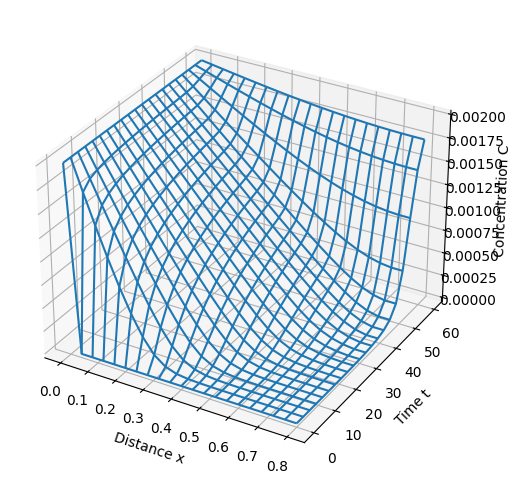

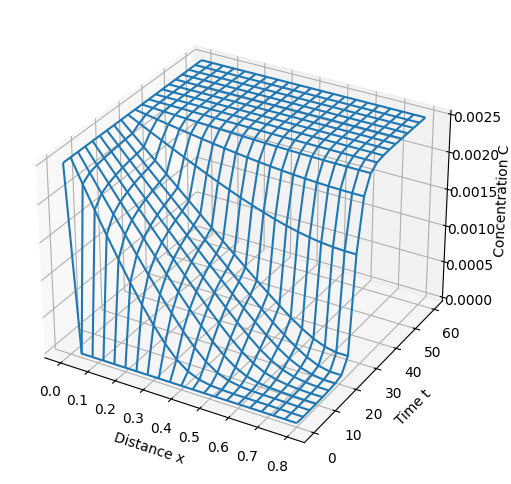

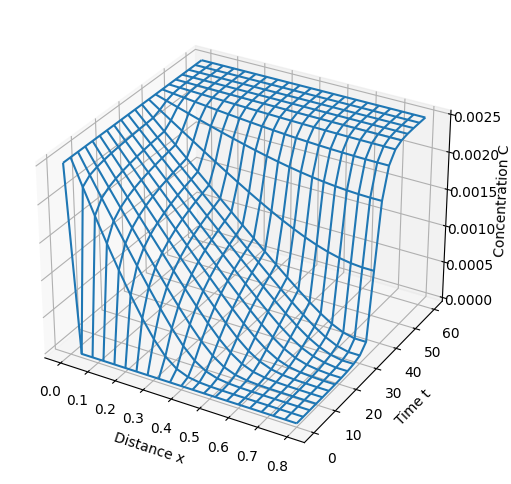

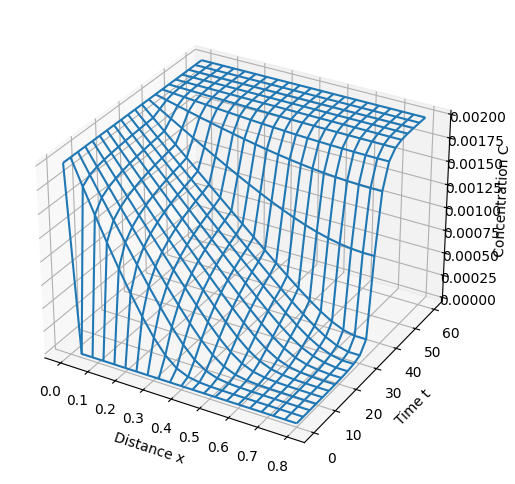

...

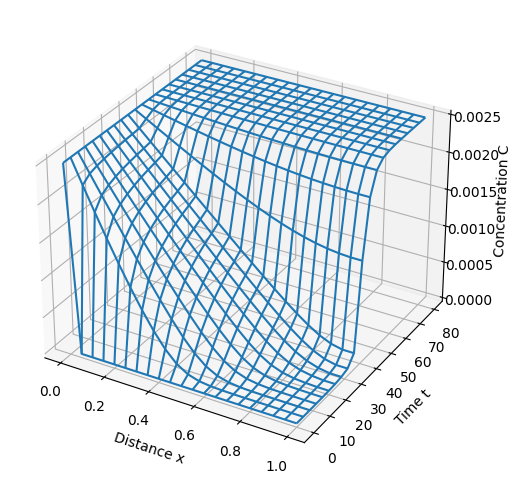

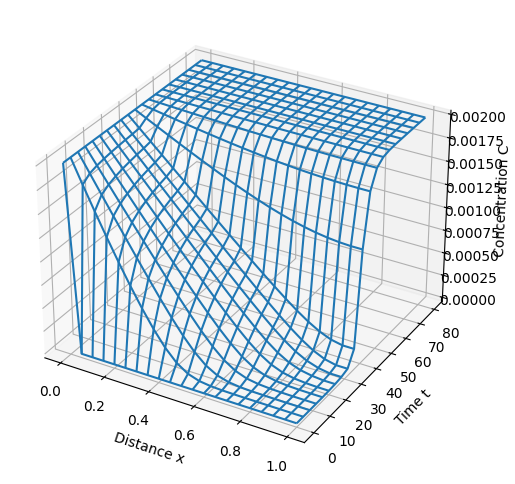

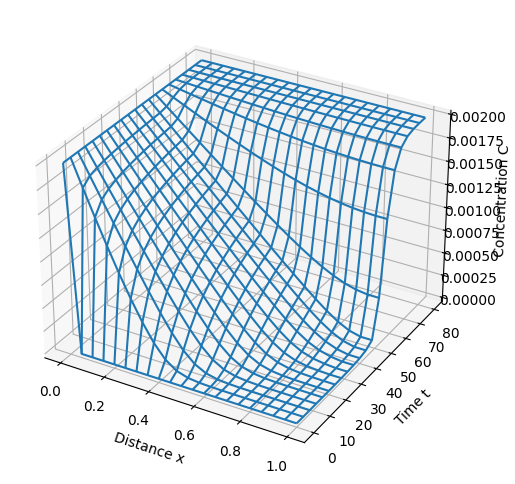

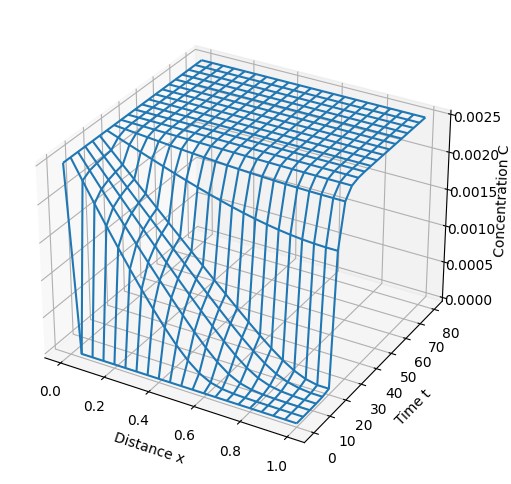

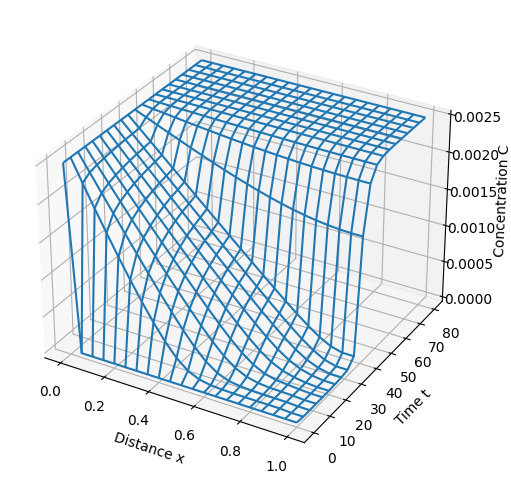

In [8]:
#Sensitive Analysis

# The function for the model
def sensitive_analysis_model(tf, D, L, KL, Cs, qm):
    m = pyo.ConcreteModel()

    m.t = dae.ContinuousSet(bounds=(0, tf))
    m.x = dae.ContinuousSet(bounds=(0, L))

    m.c = pyo.Var(m.t, m.x)
    m.dcdt = dae.DerivativeVar(m.c, wrt=m.t)
    m.dcdx = dae.DerivativeVar(m.c, wrt=m.x)
    m.d2cdx2 = dae.DerivativeVar(m.c, wrt=(m.x, m.x))

    @m.Constraint(m.t, m.x)
    def pde(m, t, x):
        return m.dcdt[t, x] * (1 + qm * KL / (1 + KL * m.c[t, x]) ** 2) == D * m.d2cdx2[t, x]

    @m.Constraint(m.t)
    def bc1(m, t):
        return m.c[t, 0] == Cs

    @m.Constraint(m.t)
    def bc2(m, t):
        return m.dcdx[t, L] == 0

    @m.Constraint(m.x)
    def ic(m, x):
        if x == 0:
            return pyo.Constraint.Skip
        return m.c[0, x] == 0.0

    return m

# Sensitivity analysis function
def sensitive_analysis():
    # Varying parameters
    parameters = {
        "tf": [60, 80],
        "D": [2.0, 2.68],
        "L": [0.8, 1.0],
        "KL": [15000.0, 20000.0],
        "Cs": [0.002, 0.0025],
        "qm": [0.8, 1.0]
    }

    for tf in parameters["tf"]:
        for D in parameters["D"]:
            for L in parameters["L"]:
                for KL in parameters["KL"]:
                    for Cs in parameters["Cs"]:
                        for qm in parameters["qm"]:
                            m = sensitive_analysis_model(tf, D, L, KL, Cs, qm)

                            # transform and solve
                            pyo.TransformationFactory('dae.finite_difference').apply_to(m, wrt=m.x, nfe=20)
                            pyo.TransformationFactory('dae.finite_difference').apply_to(m, wrt=m.t, nfe=20)
                            pyo.SolverFactory('ipopt').solve(m).write()

                            # Store the results
                            # Add code to store or analyze the results as required

                            # Visualization
                            model_plot(m)

# Call the sensitive analysis function
sensitive_analysis()
